In [1]:
import pandas as pd
import numpy as np
import joblib
import matplotlib.pyplot as plt

In [2]:
# ---- Global constants ----
MAX_GAP = 3600  # seconds (1 hour)
MIN_GAP = 60    # seconds (1 minute)


In [3]:
import numpy as np
import pandas as pd

def predict_gap(segment_df: pd.DataFrame, step: int = 60) -> pd.DataFrame:
    """Linear interpolation between start and end rows to fill the gap every `step` seconds."""
    if len(segment_df) != 2:
        raise ValueError("segment_df must have exactly 2 rows (start & end).")
    start, end = segment_df.iloc[0], segment_df.iloc[1]
    total_sec = (end['base_date_time'] - start['base_date_time']).total_seconds()
    if total_sec <= step:
        return segment_df
    n_steps = int(total_sec // step)
    times = [start['base_date_time'] + pd.Timedelta(seconds=i*step) for i in range(n_steps + 1)]
    lats = np.linspace(start['lat'], end['lat'], n_steps + 1)
    lons = np.linspace(start['lon'], end['lon'], n_steps + 1)
    mmsi_val = start['mmsi']
    df_interp = pd.DataFrame({'mmsi': mmsi_val,
                              'base_date_time': times,
                              'lat': lats,
                              'lon': lons})
    return df_interp

In [4]:
def fill_gaps_for_boat(df_boat: pd.DataFrame,
                       step: int = 60,
                       min_gap: int = MIN_GAP,
                       max_gap: int = MAX_GAP) -> pd.DataFrame:
    """Return df where each gap between min_gap and max_gap seconds is linearly interpolated."""
    df_boat = df_boat.sort_values('base_date_time').copy()
    df_boat['delta'] = df_boat['base_date_time'].diff().dt.total_seconds().fillna(0)

    rows = []
    for i in range(len(df_boat) - 1):
        row_prev = df_boat.iloc[i]
        row_next = df_boat.iloc[i + 1]
        gap = row_next['delta']
        segment = pd.DataFrame([row_prev, row_next])
        if (gap <= min_gap) or (gap > max_gap):
            # keep only previous row
            rows.append(row_prev)
        else:
            # interpolate
            df_seg = predict_gap(segment, step=step)
            # exclude last row to avoid duplication (will be added next iteration)
            rows.extend(df_seg.iloc[:-1].to_dict('records'))
    # add last original row
    rows.append(df_boat.iloc[-1])
    return pd.DataFrame(rows)

In [5]:
df = pd.read_csv("../vessel-total-clean-final.csv")

# Convertir la colonne date en datetime
df['base_date_time'] = pd.to_datetime(df['base_date_time'])

# Trier par mmsi + date (si plusieurs navires)
df = df.sort_values(['mmsi', 'base_date_time'])

In [6]:
df = df.sort_values(['mmsi', 'base_date_time'])
df['delta'] = df.groupby('mmsi')['base_date_time'].diff().dt.total_seconds()

# Choisis ici le MMSI à visualiser
mmsi_example = df['mmsi'].unique()[5]
df_boat = df[df['mmsi'] == mmsi_example].copy()

gaps = df_boat[df_boat['delta'] > 100]


In [7]:
# ---- Remplissage des gaps (≤ 1 h) pour tous les navires ----
unique_mmsi = df['mmsi'].unique()
filled_list = []
summary = []

for mmsi in unique_mmsi:
    df_boat = (df[df['mmsi'] == mmsi]
               .sort_values('base_date_time')
               .copy())
    df_boat['delta'] = df_boat['base_date_time'].diff().dt.total_seconds().fillna(0)

    df_filled = fill_gaps_for_boat(df_boat, step=60)
    filled_list.append(df_filled)

    nb_gaps = df_boat['delta'].between(MIN_GAP, MAX_GAP).sum()

    summary.append({
        'mmsi': int(mmsi),
        'pts_originaux': len(df_boat),
        'pts_ajoutes'  : len(df_filled) - len(df_boat),
        'gaps_combles' : int(nb_gaps)
    })

df_all_filled = pd.concat(filled_list, ignore_index=True)

summary_df = (pd.DataFrame(summary)
              .sort_values('gaps_combles', ascending=False)
              .reset_index(drop=True))

print(f"🚢 Navires traités : {len(summary_df)}")
display(summary_df.head(20))

AttributeError: 'dict' object has no attribute 'dtype'

In [ ]:
# ---- Carte Folium multi‑navires (une couleur par bateau) ----
import folium
from itertools import cycle

palette = cycle(['red','blue','green','purple','orange','darkred','lightred',
                 'beige','darkblue','darkgreen','cadetblue','darkpurple',
                 'white','pink','lightblue','lightgreen','gray','black','lightgray'])

center_lat = df_all_filled['lat'].mean()
center_lon = df_all_filled['lon'].mean()
m = folium.Map(location=[center_lat, center_lon], zoom_start=5, control_scale=True)

for mmsi, group in df_all_filled.groupby('mmsi'):
    color = next(palette)
    coords = list(zip(group['lat'], group['lon']))
    folium.PolyLine(coords, color=color, weight=2, opacity=0.8,
                    tooltip=str(mmsi)).add_to(m)

m

In [ ]:
# ── Diagnostic des gaps réels ──
print(f"=== Diagnostic pour le navire {mmsi_example} ===")
for i in range(1, len(df_boat)):
    t0 = df_boat.iloc[i-1]['base_date_time']
    t1 = df_boat.iloc[i  ]['base_date_time']
    gap = (t1 - t0).total_seconds()
    if gap > MAX_GAP:
        print(f"Gap de {gap:.0f}s entre lignes {i-1} et {i} : {t0} → {t1}")
print("=== Fin du diagnostic ===\n")

=== Diagnostic pour le navire 241452000 ===
Gap de 2010s entre lignes 0 et 1 : 2023-05-25 10:41:39 → 2023-05-25 11:15:09
Gap de 325s entre lignes 1 et 2 : 2023-05-25 11:15:09 → 2023-05-25 11:20:34
Gap de 587s entre lignes 2 et 3 : 2023-05-25 11:20:34 → 2023-05-25 11:30:21
Gap de 420s entre lignes 3 et 4 : 2023-05-25 11:30:21 → 2023-05-25 11:37:21
Gap de 558s entre lignes 4 et 5 : 2023-05-25 11:37:21 → 2023-05-25 11:46:39
Gap de 187s entre lignes 5 et 6 : 2023-05-25 11:46:39 → 2023-05-25 11:49:46
Gap de 240s entre lignes 6 et 7 : 2023-05-25 11:49:46 → 2023-05-25 11:53:46
Gap de 797s entre lignes 7 et 8 : 2023-05-25 11:53:46 → 2023-05-25 12:07:03
Gap de 15870s entre lignes 8 et 9 : 2023-05-25 12:07:03 → 2023-05-25 16:31:33
Gap de 4920s entre lignes 9 et 10 : 2023-05-25 16:31:33 → 2023-05-25 17:53:33
Gap de 1188s entre lignes 10 et 11 : 2023-05-25 17:53:33 → 2023-05-25 18:13:21
Gap de 1390s entre lignes 11 et 12 : 2023-05-25 18:13:21 → 2023-05-25 18:36:31
Gap de 180s entre lignes 13 et 14

In [ ]:
import joblib
model = joblib.load("trajectoire.pkl")


step = 60  # 1 min
min_gap_fill = MIN_GAP
max_gap_fill = MAX_GAP  # 1 hour


all_filled = []
for i in range(1, len(df_boat)):
    gap = df_boat.iloc[i]['delta']
    if (gap <= min_gap_fill) or (gap > max_gap_fill):
        continue

    row_prev = df_boat.iloc[i-1]
    row_next = df_boat.iloc[i]
    segment  = pd.DataFrame([row_prev, row_next])

    df_seg = predict_gap(segment, model, step=step)
    all_filled.append(df_seg)

filled_df = pd.concat(all_filled, ignore_index=True)
print("✅ Points prédits pour comblement :", len(filled_df))

✅ Points prédits pour comblement : 6814


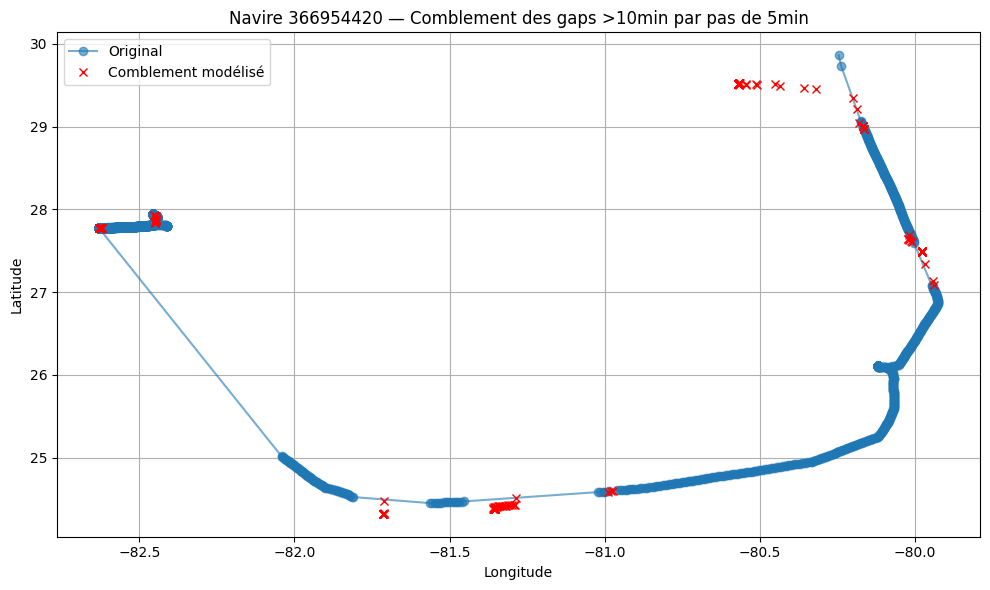

In [ ]:
plt.figure(figsize=(10,6))
# trajectoire mesurée
plt.plot(df_boat['lon'], df_boat['lat'], 'o-', label='Original', alpha=0.6)
# prédictions comblées
plt.plot(filled_df['lon'], filled_df['lat'], 'x', label='Comblement modélisé', color='red')

plt.title(f"Navire {mmsi_example} — Comblement des gaps >10min par pas de 5min")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# %%  — Carte Folium
import folium

# centre grossier : milieu de la trajectoire
center = [
    0.5 * (df_boat.lat.min() + df_boat.lat.max()),
    0.5 * (df_boat.lon.min() + df_boat.lon.max())
]

m = folium.Map(location=center, zoom_start=7, tiles="cartodbpositron")

# ---------- points originaux (bleu) ----------
orig_layer = folium.FeatureGroup(name="Positions originales").add_to(m)
for lat, lon, t in zip(df_boat.lat, df_boat.lon, df_boat.base_date_time):
    folium.CircleMarker(
        location=[lat, lon],
        radius=3,
        color="#1f77b4",              # contour bleu
        fill=True, fill_color="#1f77b4", fill_opacity=0.8,
        tooltip=str(t)
    ).add_to(orig_layer)

# ---------- points comblés (rouge) ----------
if not filled_df.empty:
    fill_layer = folium.FeatureGroup(name="Positions comblées").add_to(m)
    for lat, lon, t in zip(filled_df.lat, filled_df.lon, filled_df.base_date_time):
        folium.CircleMarker(
            location=[lat, lon],
            radius=3,
            color="#d62728",
            fill=True, fill_color="#d62728", fill_opacity=0.9,
            tooltip=f"Comblé : {t}"
        ).add_to(fill_layer)

# bascule d’affichage
folium.LayerControl().add_to(m)

m    # affiche la carte interactive dans le notebook